## Importing all the Libraries

In [54]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import seaborn as sns
from scipy.spatial.distance import pdist, squareform

## Preprocessing

In [55]:
df = pd.read_csv("./dataset/DM1_game_dataset_cleaned.csv")

df.columns

Index(['Name', 'YearPublished', 'GameWeight', 'MinPlayers', 'MaxPlayers',
       'MfgPlaytime', 'MfgAgeRec', 'NumAlternates', 'NumExpansions',
       'NumImplementations', 'IsReimplementation', 'Kickstarted', 'Rating',
       'HasFamily', 'Category', 'Rank', 'EngagementLevel'],
      dtype='object')

Excluded columns due to high zero values: ['NumAlternates', 'NumExpansions', 'NumImplementations']
Log-transforming columns: ['YearPublished', 'MinPlayers', 'MaxPlayers', 'MfgPlaytime']
Rows removed: 4376


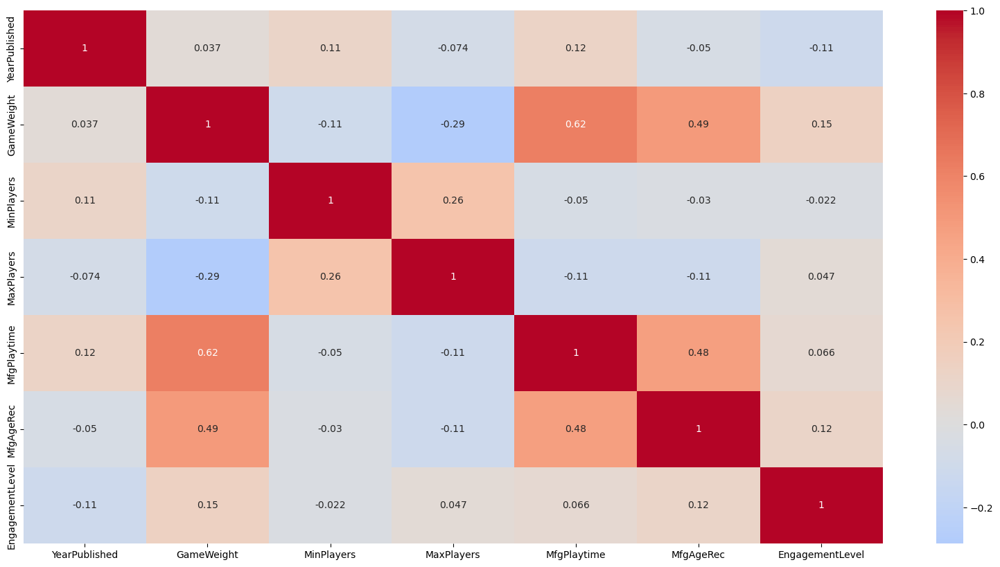

In [56]:
# --- 1. Select numeric columns ---
df_num = df.select_dtypes(include=['float64', 'int64'])

# Remove binaries and Rank columns
numeric_cols = [col for col in df_num.columns if df_num[col].nunique() > 2 and 'Rank' not in col]
df_num = df_num[numeric_cols].copy()

# --- 2. Fix YearPublished (recency) ---
if 'YearPublished' in df_num.columns:
    df_num['YearPublished'] = df_num['YearPublished'].max() - df_num['YearPublished']


# --- 3. Exclude columns with high zero values ---
zero_threshold = 0.5
cols_to_exclude = [col for col in df_num.columns if (df_num[col] == 0).mean() > zero_threshold]
df_num.drop(columns=cols_to_exclude, inplace=True)
print("Excluded columns due to high zero values:", cols_to_exclude)

# log transform skewed columns except EngagementLevel
skewed_cols = df_num.skew().abs()
log_cols = skewed_cols[((skewed_cols > 1.0) | (skewed_cols < -1.0)) & (skewed_cols.index != 'EngagementLevel')].index.tolist()
df_num[log_cols] = df_num[log_cols].apply(np.log1p)
print("Log-transforming columns:", log_cols)

# --- 4. Standardize BEFORE outlier detection ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_num)


# --- 5. Compute robust center (median in scaled space) ---
center = np.median(X_scaled, axis=0)

dists = np.linalg.norm(X_scaled - center, axis=1)

threshold = np.percentile(dists, 80.0)  # top 15% as outliers

mask_keep = dists <= threshold

print("Rows removed:", np.sum(~mask_keep))

# Filter dataset
df_filtered = df_num.loc[mask_keep].reset_index(drop=True)
X_filtered = X_scaled[mask_keep]


# --- 7. Correlation Matrix ---
plt.figure(figsize=(20,10))
sns.heatmap(df_filtered.corr(), cmap="coolwarm", center=0, annot=True)
plt.show()


## Ward Linkage Method

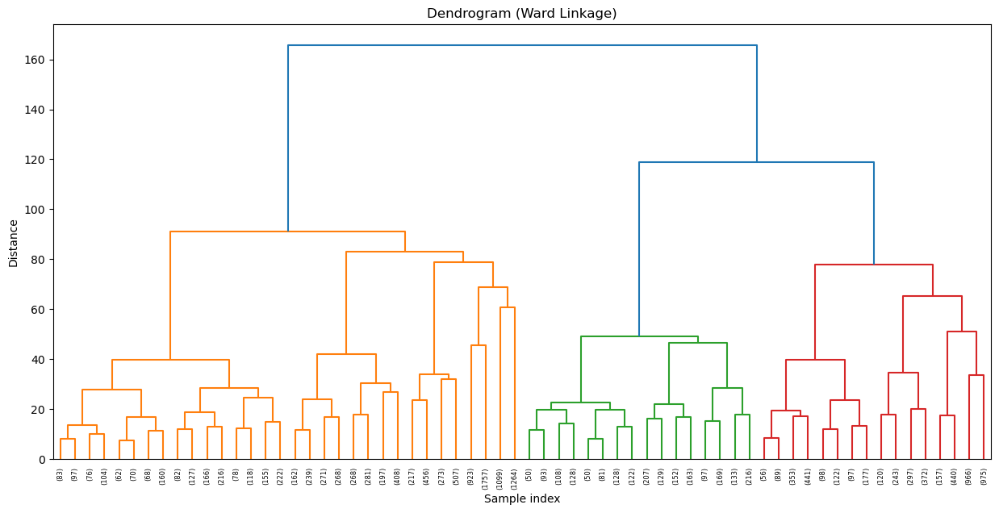

In [57]:
#creating the linkage matrix with Ward method
Z = linkage(X_filtered, method='ward')
# Plotting the dendrogram
plt.figure(figsize=(15, 7))
dendrogram(Z, truncate_mode='level', p=5)
plt.title('Dendrogram (Ward Linkage)')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()


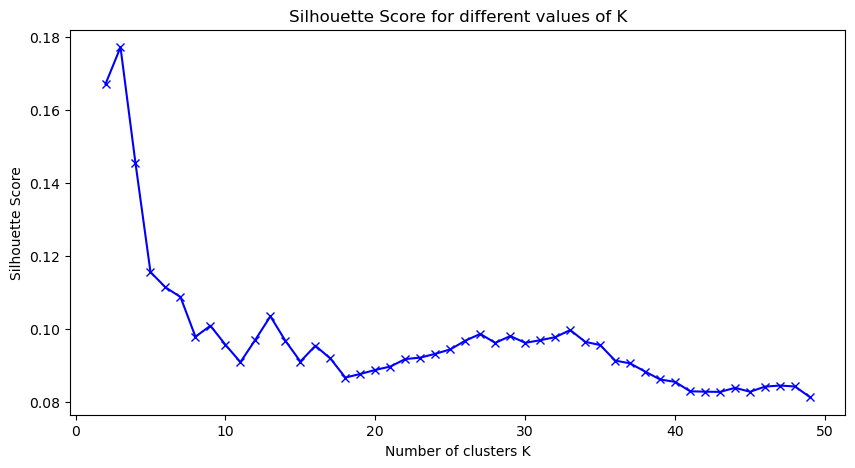

In [58]:
#analyzing the silhouette scores for different number of clusters
from sklearn.metrics import silhouette_score
silhouette_scores = []
K = range(2, 50)
for k in K:
    cluster_labels = fcluster(Z, k, criterion='maxclust')
    score = silhouette_score(X_filtered, cluster_labels)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K')
plt.show()  

In [59]:
#creating clusters for the best k
best_k = 3  # assuming 2 is the best k from silhouette analysis
cluster_labels = fcluster(Z, best_k, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels
print(df_filtered['Cluster'].value_counts())

Cluster
1    10474
3     5003
2     2026
Name: count, dtype: int64



=== HasFamily: percentuali nei cluster ===
HasFamily      0      1
Cluster                
1          69.95  30.05
2          70.19  29.81
3          69.86  30.14


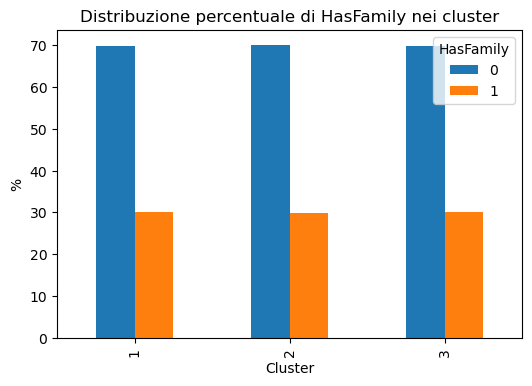


=== IsReimplementation: percentuali nei cluster ===
IsReimplementation      0      1
Cluster                         
1                   88.71  11.29
2                   89.24  10.76
3                   88.09  11.91


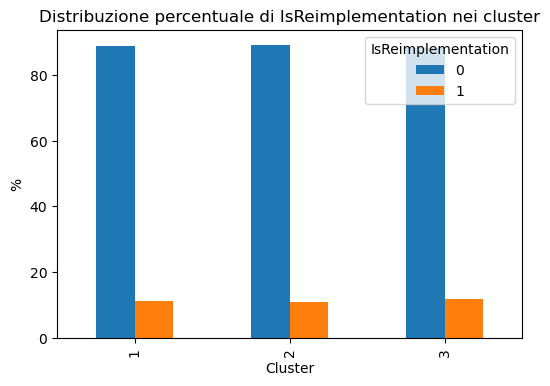


=== Kickstarted: percentuali nei cluster ===
Kickstarted      0      1
Cluster                  
1            84.38  15.62
2            84.55  15.45
3            85.03  14.97


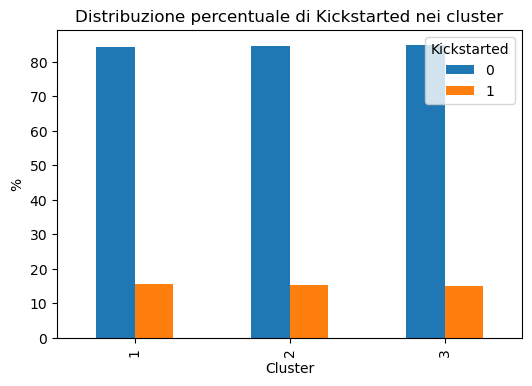

In [60]:
#analyzing clusters respect to binary variables
binary_cols = ['HasFamily', 'IsReimplementation', 'Kickstarted']

for col in binary_cols:
    print(f"\n=== {col}: percentuali nei cluster ===")
    
    # crosstab in percentuale
    pct = (
        pd.crosstab(df_filtered['Cluster'], df[col], normalize='index') * 100
    ).round(2)
    
    print(pct)

    # Plot
    pct.plot(kind='bar', figsize=(6,4))
    plt.title(f'Distribuzione percentuale di {col} nei cluster')
    plt.ylabel('%')
    plt.xlabel('Cluster')
    plt.legend(title=col)
    plt.show()


In [72]:
#analyzing clusters respect to categorical variables
category_pct = (
    pd.crosstab(
        df_filtered['Cluster'],
        df.loc[df_filtered.index, 'Category'],   # Category presa dal df originale
        normalize='index'
    ) * 100
).round(2)

category_pct



Category,Abstract,CGS,Childrens,Family,NoCategory,Party,Strategy,Thematic,War
Cluster,,,,,,,,,
1,4.75,1.36,3.84,8.33,51.86,3.00,6.97,4.99,14.91
2,5.18,1.48,4.20,8.74,50.59,2.57,7.26,5.08,14.91
3,5.28,1.30,3.92,8.63,50.37,2.88,7.52,4.66,15.45


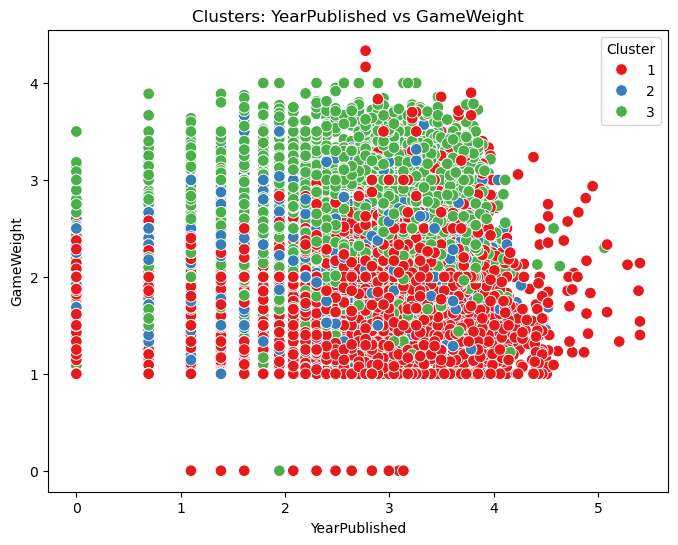

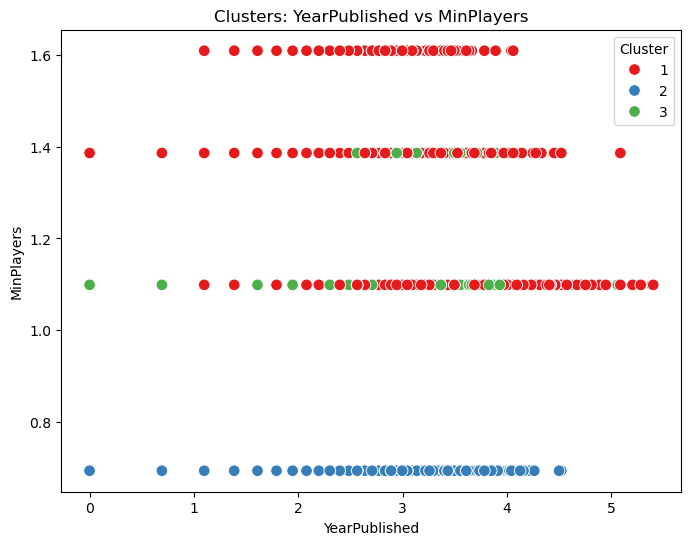

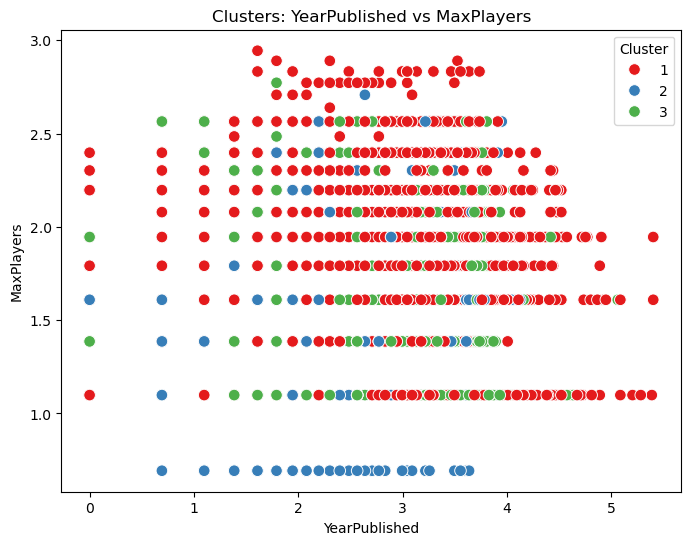

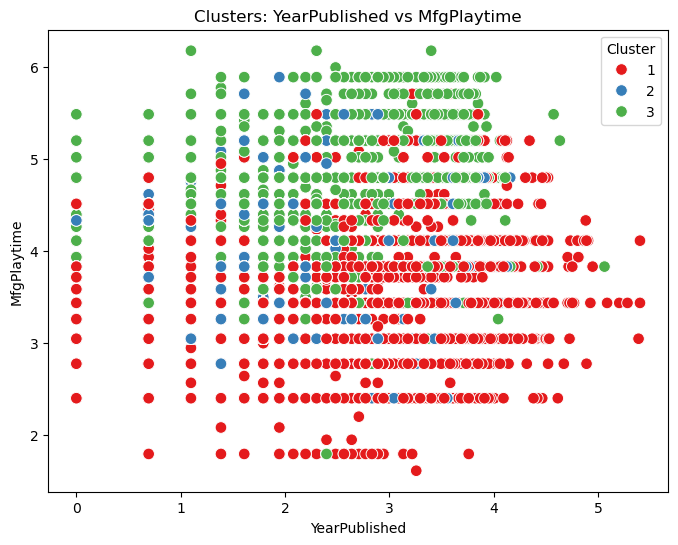

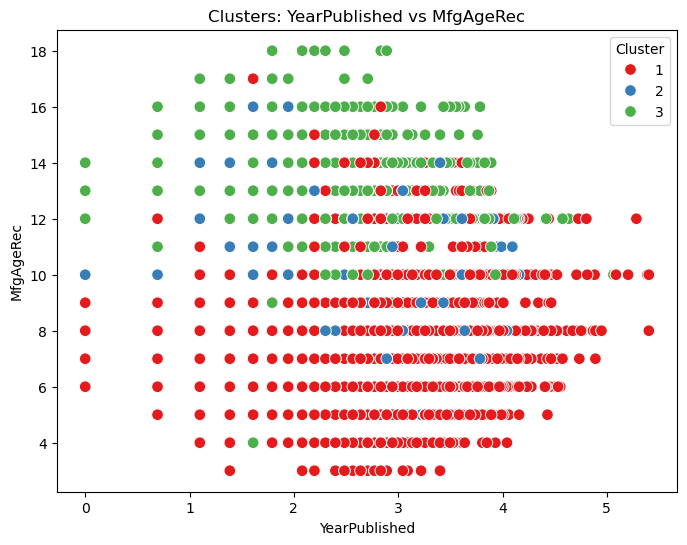

...

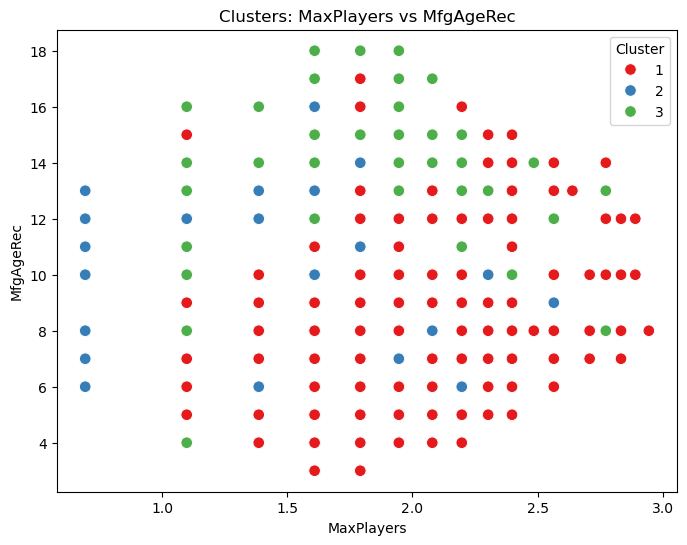

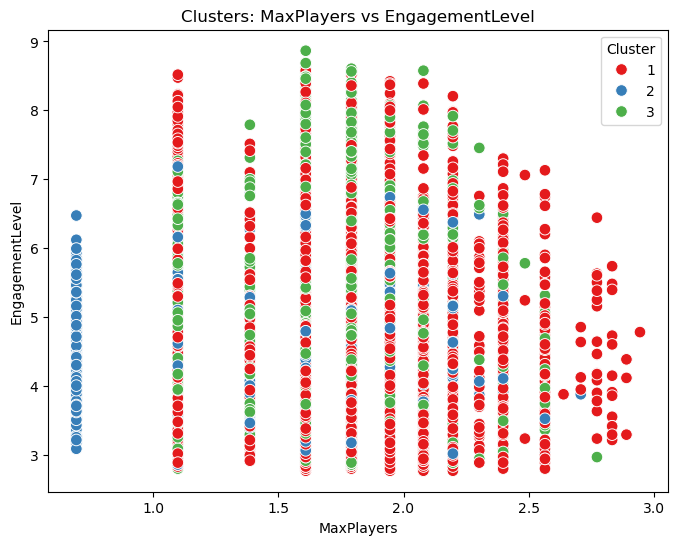

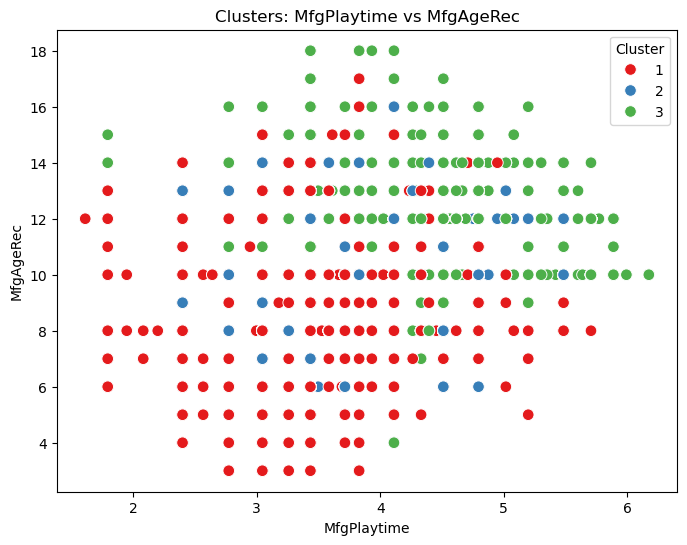

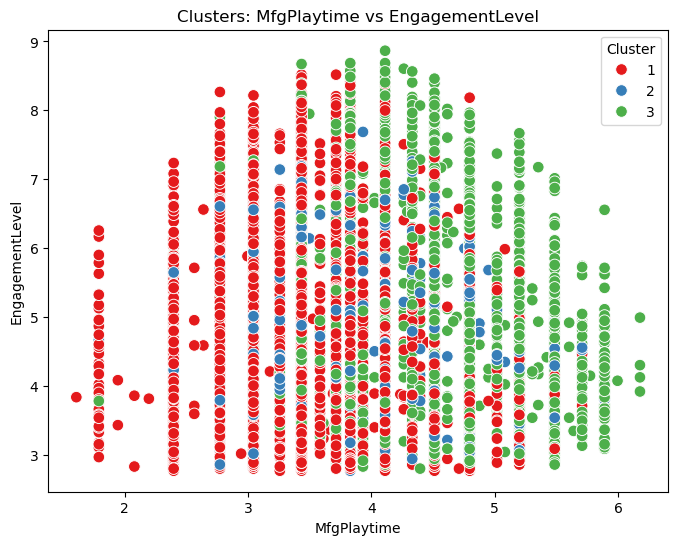

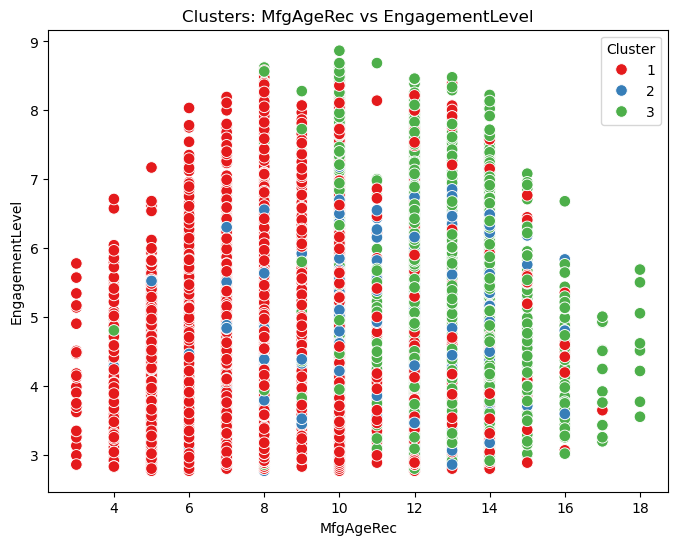

In [63]:
#generating scatter plots for each pair of features colored by cluster
feature_cols = [col for col in df_filtered.columns if col != "Cluster"]

for i in range(len(feature_cols)):
    for j in range(i + 1, len(feature_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(
            data=df_filtered,
            x=feature_cols[i],
            y=feature_cols[j],
            hue=df_filtered["Cluster"],
            palette="Set1",
            s=70
        )
        plt.title(f"Clusters: {feature_cols[i]} vs {feature_cols[j]}")
        plt.legend(title="Cluster")
        plt.show()

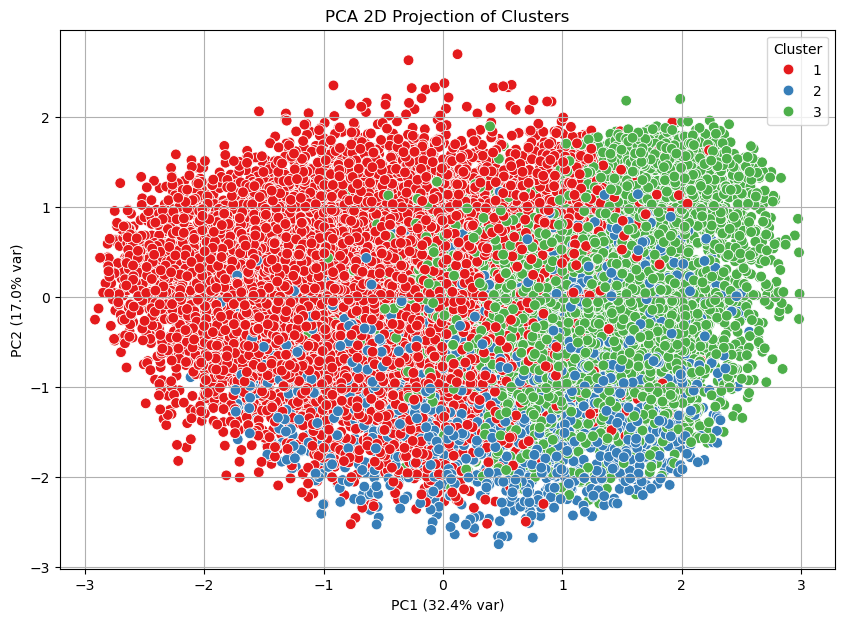

In [37]:
#PCA analysis for cluster visualization
from sklearn.decomposition import PCA
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_filtered)

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d[:, 0],
    y=X_pca_2d[:, 1],
    hue=cluster_labels,
    palette="Set1",
    s=60
)

plt.title("PCA 2D Projection of Clusters")
plt.xlabel(f"PC1 ({pca_2d.explained_variance_ratio_[0]*100:.1f}% var)")
plt.ylabel(f"PC2 ({pca_2d.explained_variance_ratio_[1]*100:.1f}% var)")
plt.legend(title="Cluster")
plt.grid(True)
plt.show()

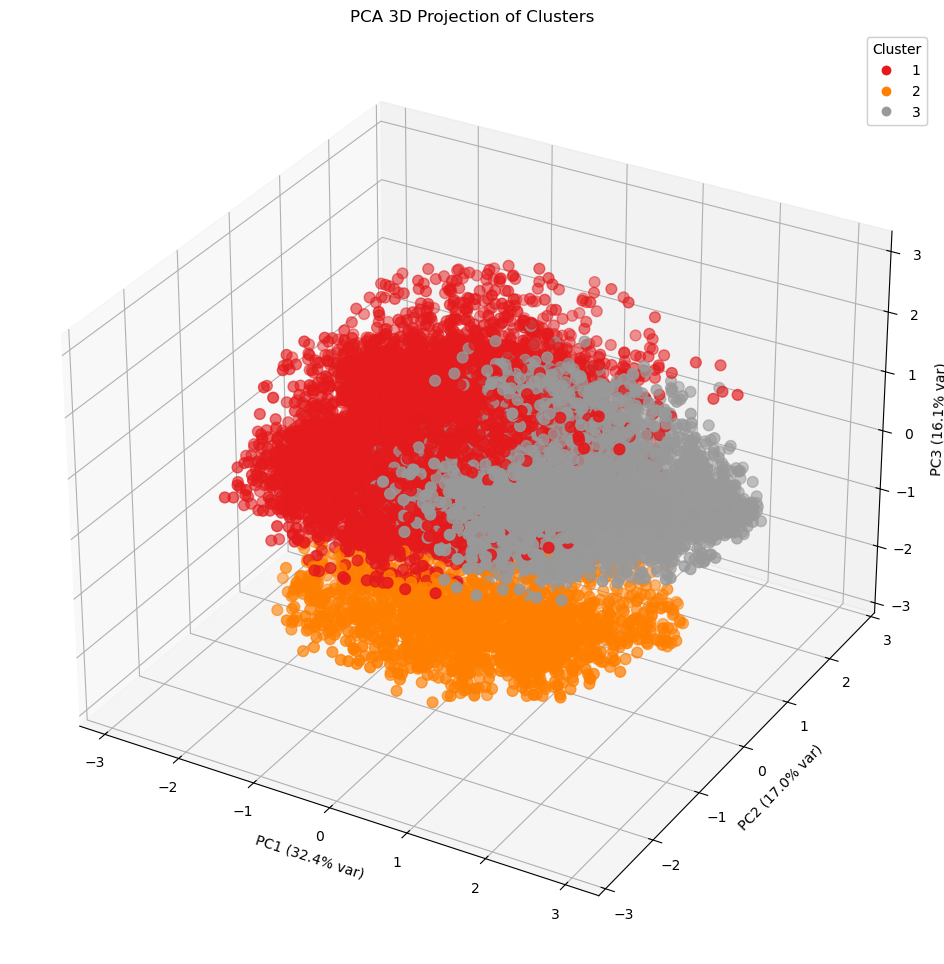

In [38]:
#pca with 3 components
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_filtered)

fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    X_pca_3d[:, 0],
    X_pca_3d[:, 1],
    X_pca_3d[:, 2],
    c=cluster_labels,
    cmap="Set1",
    s=60
)

ax.set_title("PCA 3D Projection of Clusters")
ax.set_xlabel(f"PC1 ({pca_3d.explained_variance_ratio_[0]*100:.1f}% var)")
ax.set_ylabel(f"PC2 ({pca_3d.explained_variance_ratio_[1]*100:.1f}% var)")
ax.set_zlabel(f"PC3 ({pca_3d.explained_variance_ratio_[2]*100:.1f}% var)")

legend1 = ax.legend(*scatter.legend_elements(), title="Cluster")
ax.add_artist(legend1)

plt.show()

In [69]:
#checking if there exist differences in numeric variables across clusters
numeric_vars = ['GameWeight', 'EngagementLevel', 'MfgPlaytime', 'MfgAgeRec']

# Calcola solo mean e median
stats_clean = (
    df_filtered
    .groupby('Cluster')[numeric_vars]
    .agg(['mean', 'median'])
    .round(2)
)

# Rende la tabella più leggibile rinominando le colonne
stats_clean.columns = [
    f"{var}_{stat}" for var, stat in stats_clean.columns
]

stats_clean




,GameWeight_mean,GameWeight_median,EngagementLevel_mean,EngagementLevel_median,MfgPlaytime_mean,MfgPlaytime_median,MfgAgeRec_mean,MfgAgeRec_median
Cluster,,,,,,,,
1,1.61,1.56,4.47,4.20,3.52,3.43,8.85,8.0
2,2.04,2.00,4.70,4.54,3.92,3.83,10.46,10.0
3,2.49,2.53,4.86,4.65,4.37,4.33,12.03,12.0


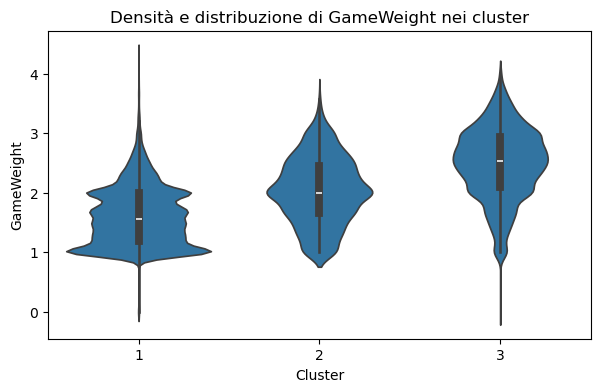

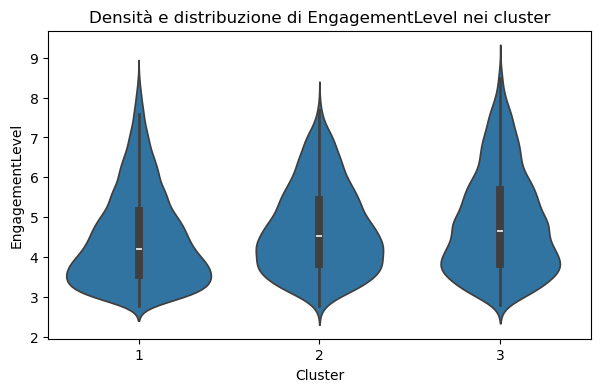

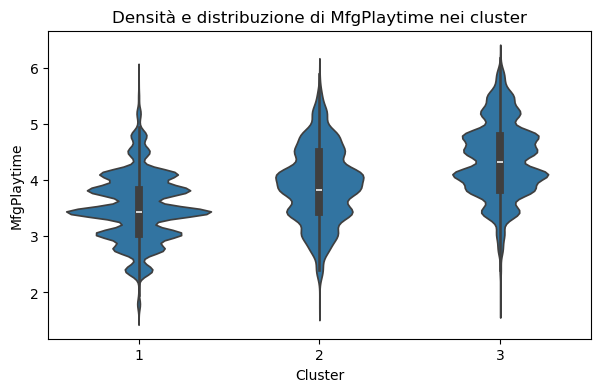

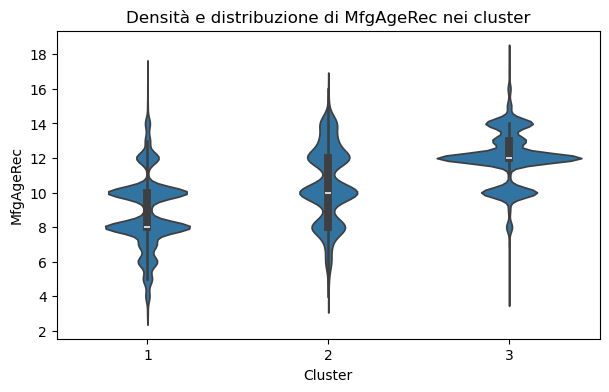

In [67]:
for col in numeric_vars:
    plt.figure(figsize=(7,4))
    sns.violinplot(x='Cluster', y=col, data=df_filtered)
    plt.title(f'Densità e distribuzione di {col} nei cluster')
    plt.show()


## Complete Linkage Method

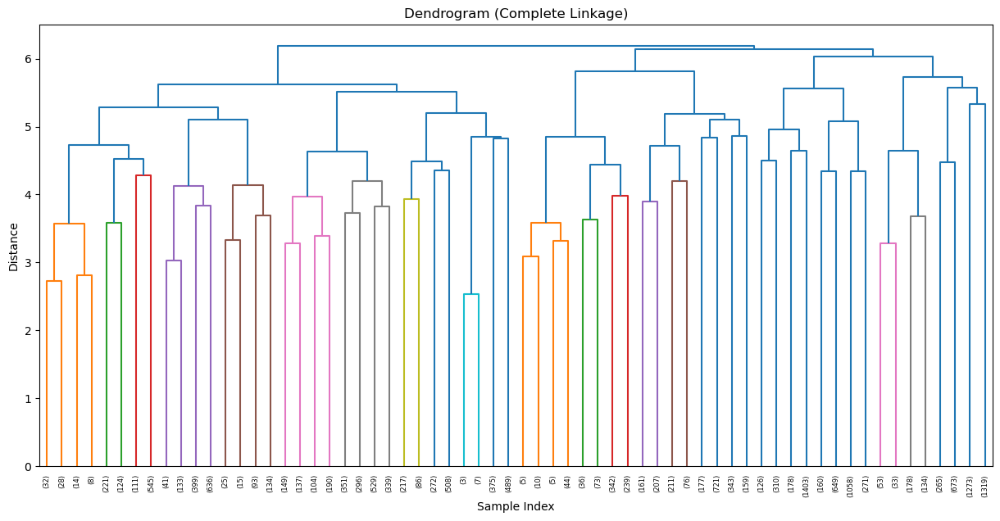

In [40]:
Z_complete = linkage(X_filtered, method='complete')

# === Dendrogram ===
plt.figure(figsize=(15, 7))
dendrogram(
    Z_complete,
    truncate_mode='level',
    p=5
)
plt.title('Dendrogram (Complete Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()


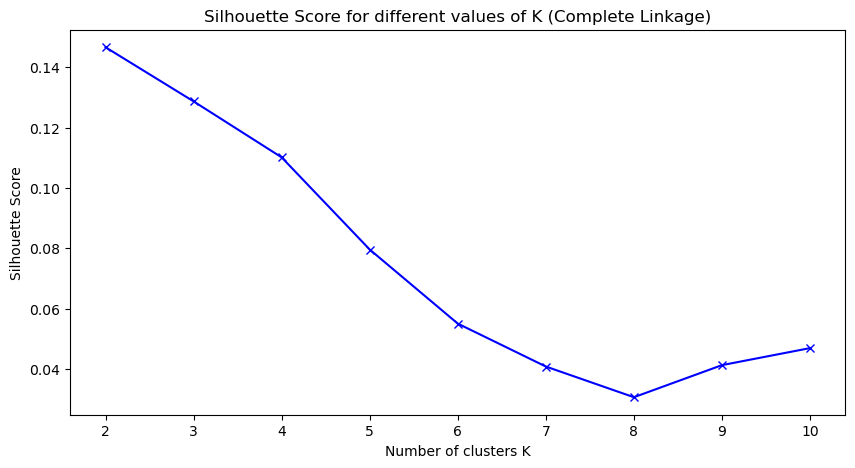

In [41]:
#silhouette analysis for complete linkage, plotting the scores
silhouette_scores_complete = []
K = range(2, 11)
for k in K:
    cluster_labels_complete = fcluster(Z_complete, k, criterion='maxclust')
    score_complete = silhouette_score(X_filtered, cluster_labels_complete)
    silhouette_scores_complete.append(score_complete)
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores_complete, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Complete Linkage)')
plt.show()

In [42]:
#assigning clusters for complete linkage 
best_k_complete = 2  # assuming 2 is the best k from silhouette analysis
cluster_labels_complete = fcluster(Z_complete, best_k_complete, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels_complete
print(df_filtered['Cluster'].value_counts())    

Cluster
2    10892
1     6611
Name: count, dtype: int64


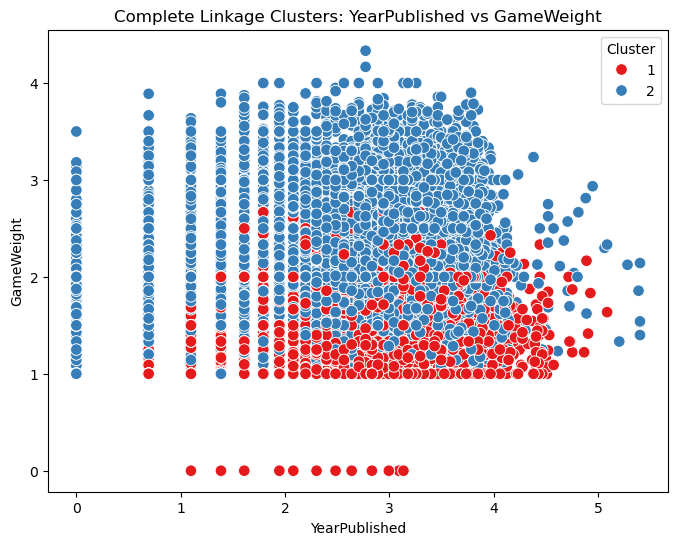

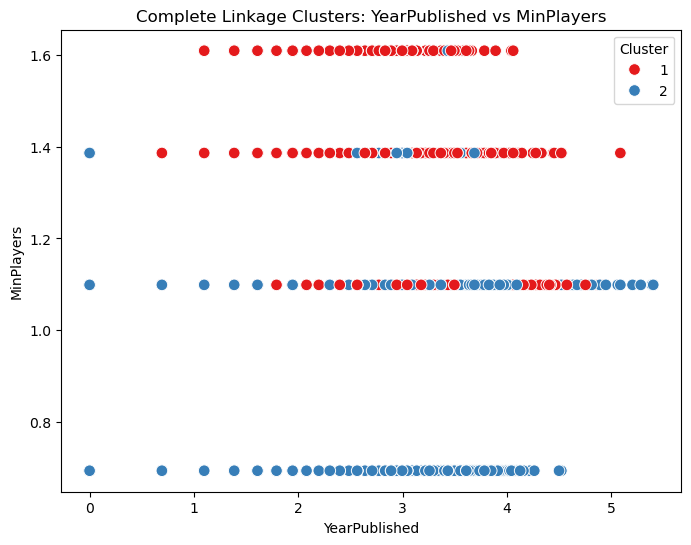

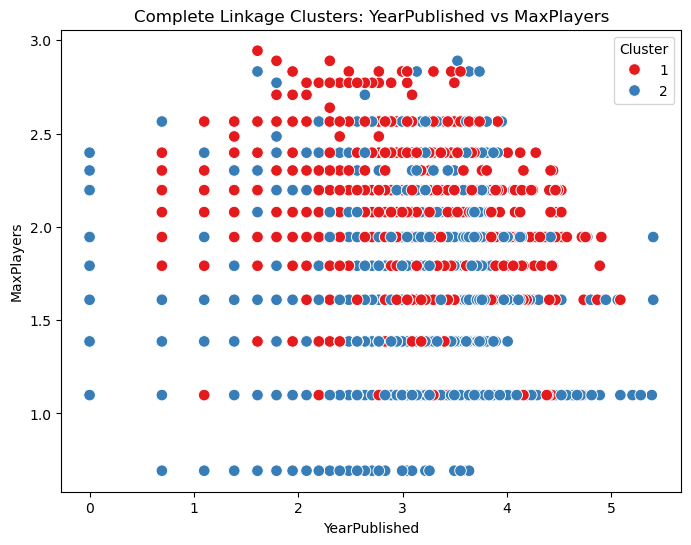

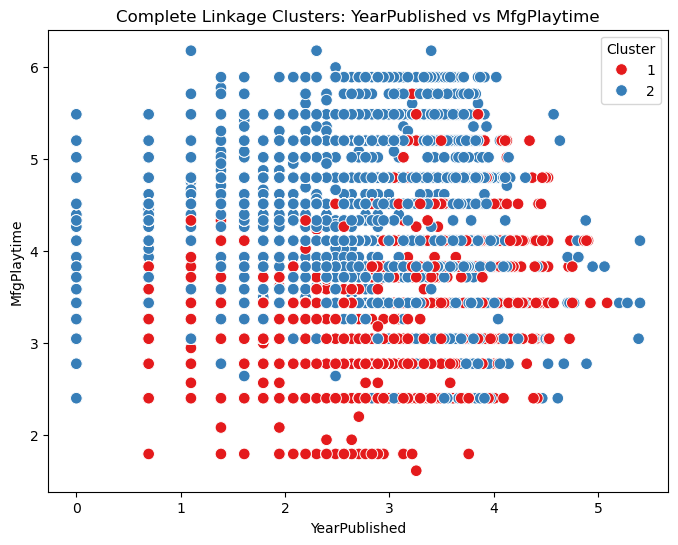

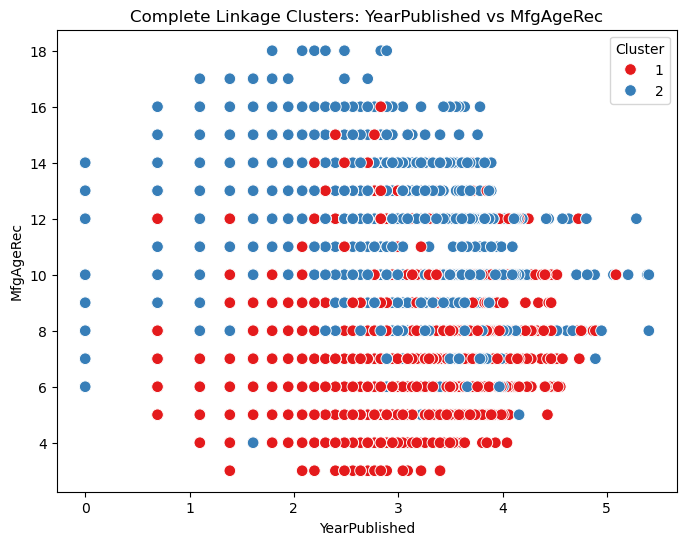

...

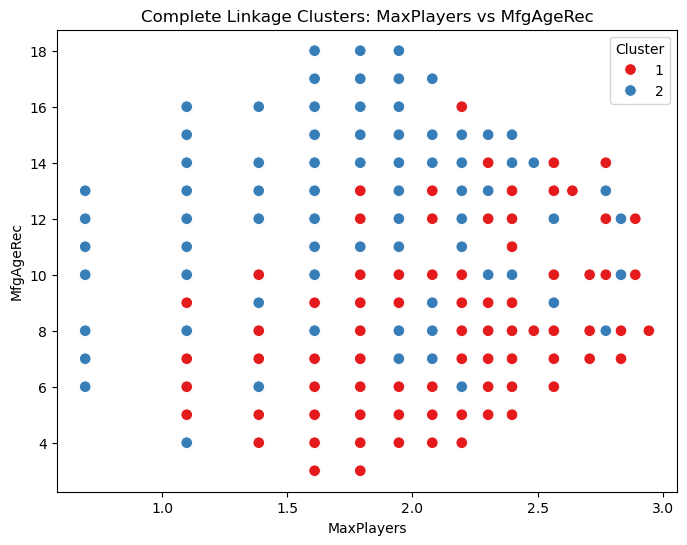

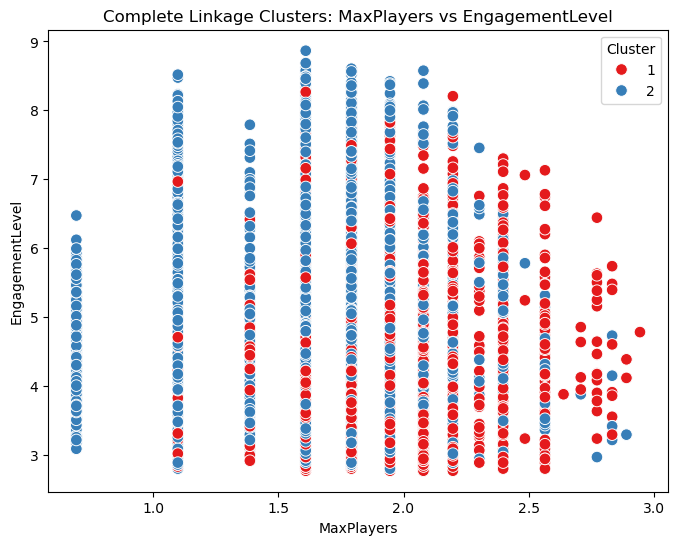

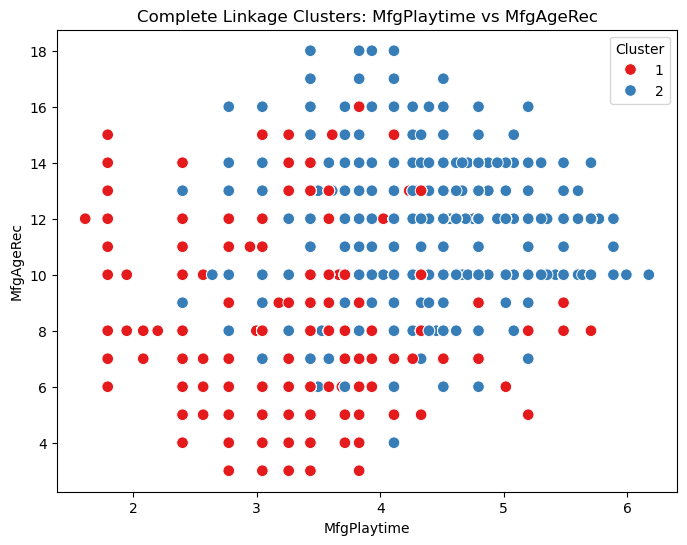

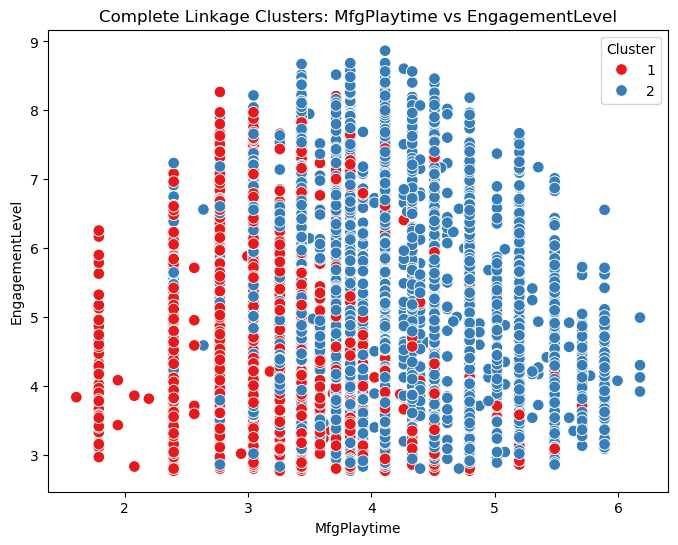

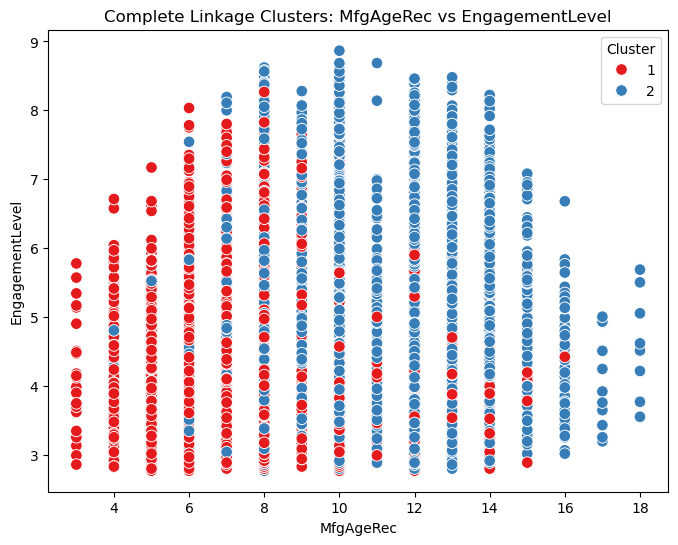

In [43]:
#plotting scatter plots for complete linkage clusters for each pair of features in the filtered dataset
feature_cols = [col for col in df_filtered.columns if col != "Cluster"]
for i in range(len(feature_cols)):
    for j in range(i + 1, len(feature_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(
            data=df_filtered,
            x=feature_cols[i],
            y=feature_cols[j],
            hue=df_filtered["Cluster"],
            palette="Set1",
            s=70
        )
        plt.title(f"Complete Linkage Clusters: {feature_cols[i]} vs {feature_cols[j]}")
        plt.legend(title="Cluster")
        plt.show()

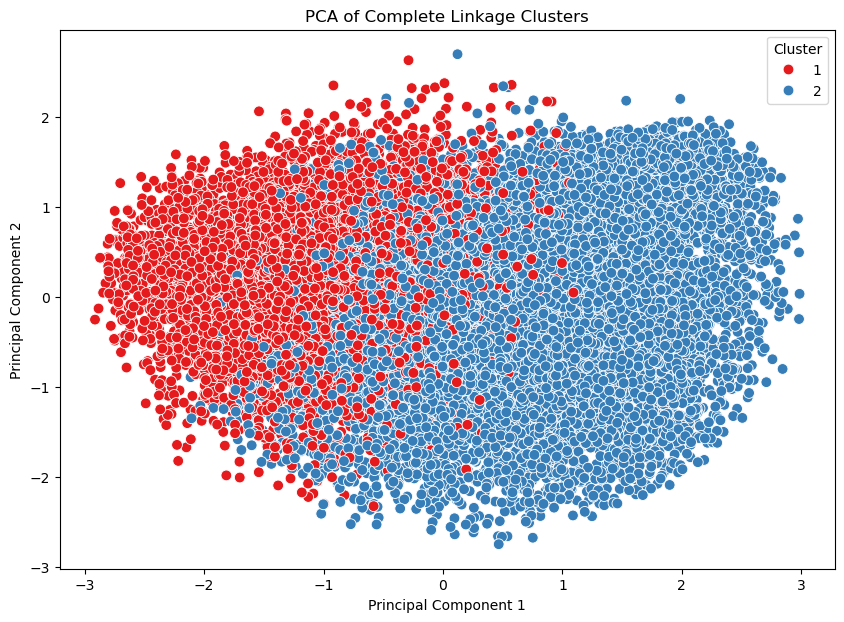

In [44]:
#pca analysis for complete linkage clusters
pca_2d_complete = PCA(n_components=2)
X_pca_2d_complete = pca_2d_complete.fit_transform(X_filtered)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d_complete[:, 0],
    y=X_pca_2d_complete[:, 1],
    hue=cluster_labels_complete,
    palette="Set1",
    s=60
)
plt.title("PCA of Complete Linkage Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.show()


## Single Linkage

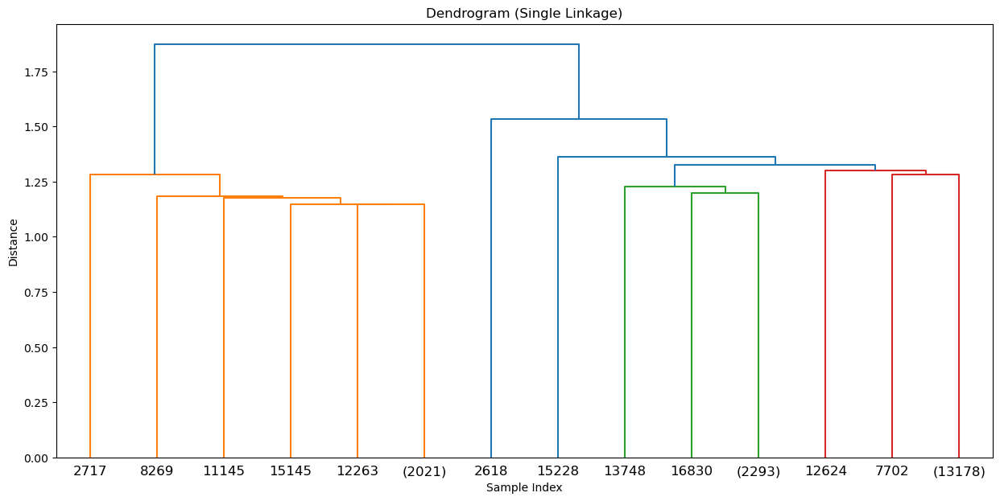

In [45]:
Z_single = linkage(X_filtered, method='single')

# === Plot Dendrogram ===
plt.figure(figsize=(15, 7))
dendrogram(
    Z_single,
    truncate_mode='level',
    p=5
)
plt.title('Dendrogram (Single Linkage)')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

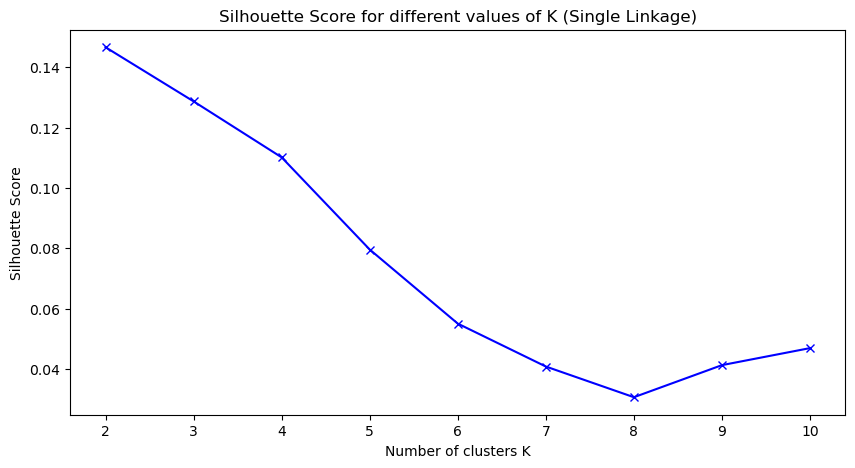

In [46]:
#silhouette analysis for complete linkage
silhouette_scores_complete = []
K = range(2, 11)
for k in K:
    cluster_labels_complete = fcluster(Z_complete, k, criterion='maxclust')
    score_complete = silhouette_score(X_filtered, cluster_labels_complete)
    silhouette_scores_complete.append(score_complete)
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores_complete, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Single Linkage)')
plt.show()

In [47]:
#assigning clusters for single linkage for k = 2
best_k_single = 2  # assuming 2 is the best k from silhouette analysis
cluster_labels_single = fcluster(Z_single, best_k_single, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels_single
print(df_filtered['Cluster'].value_counts())

Cluster
2    15477
1     2026
Name: count, dtype: int64


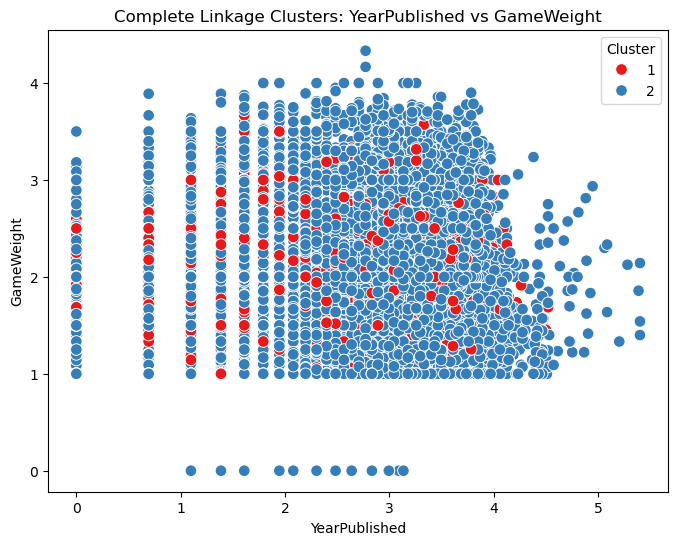

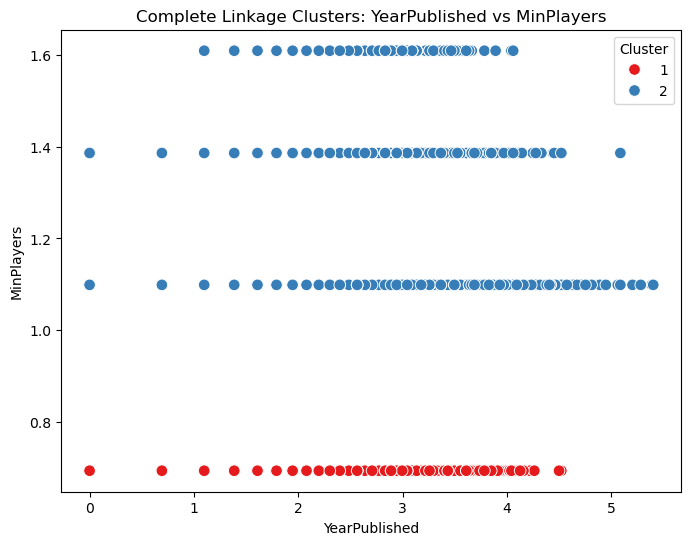

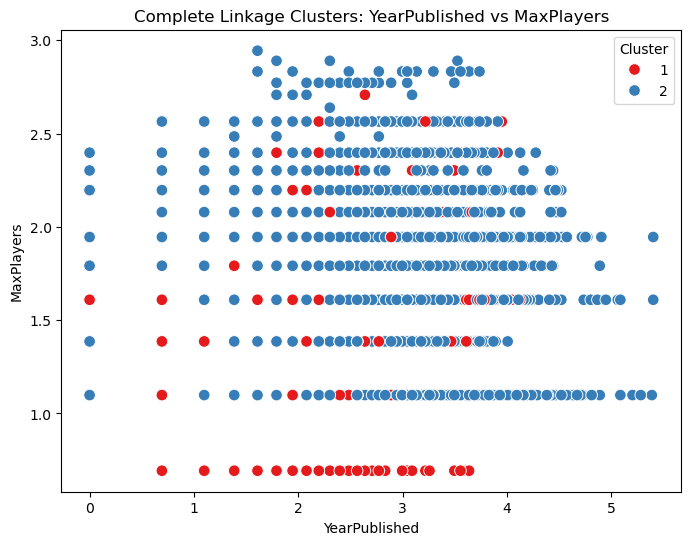

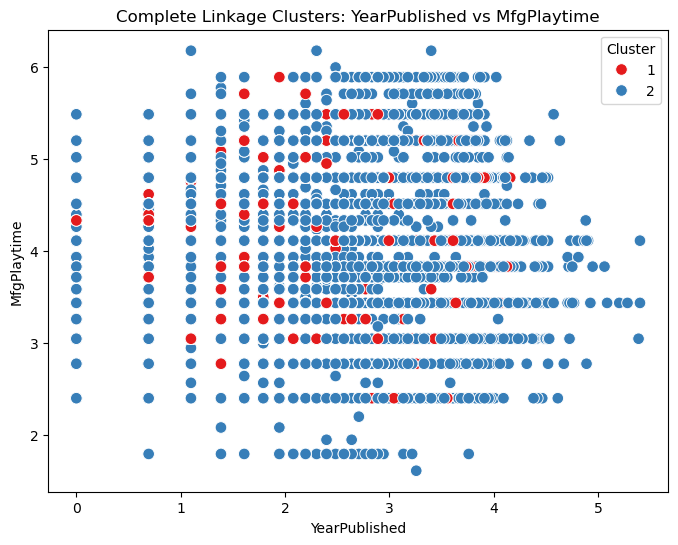

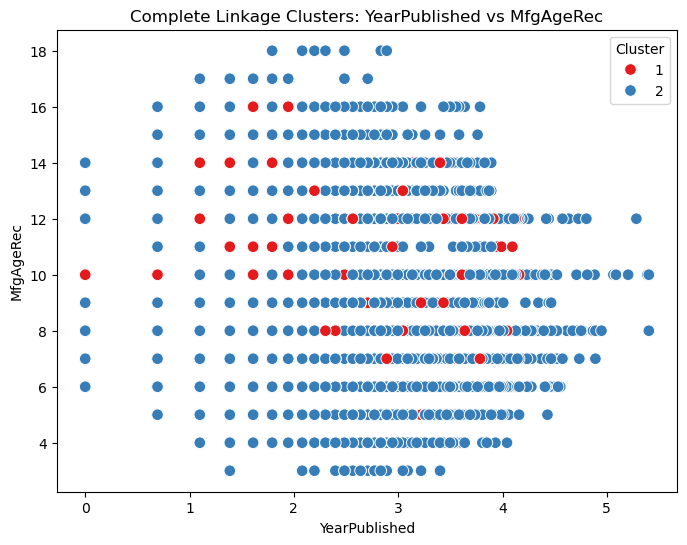

...

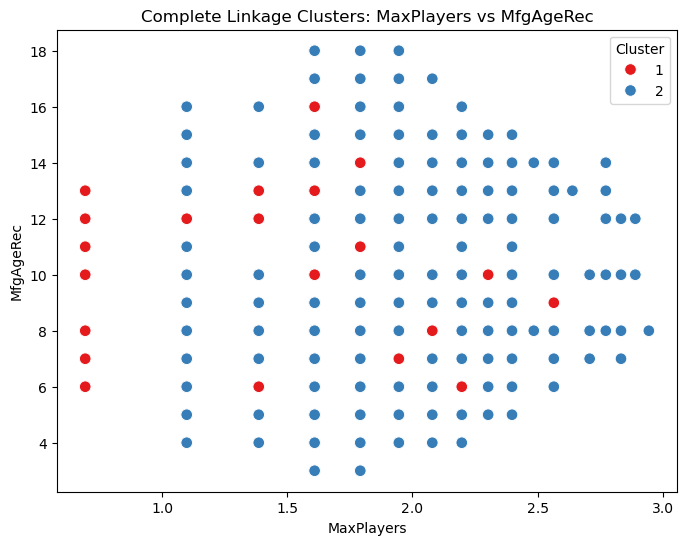

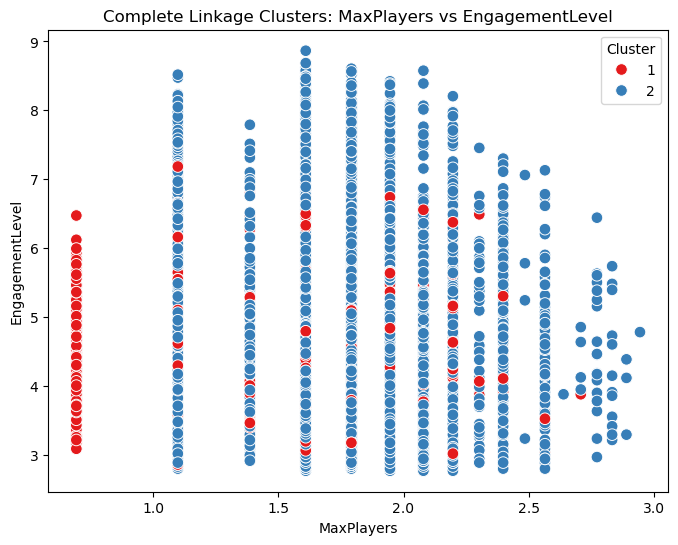

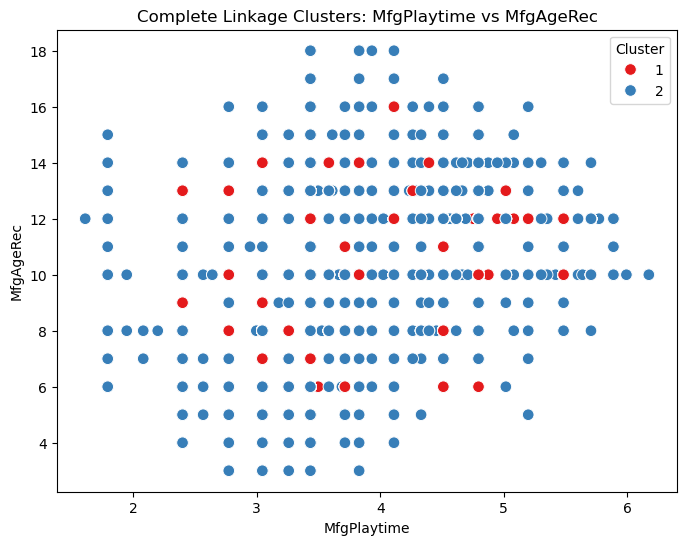

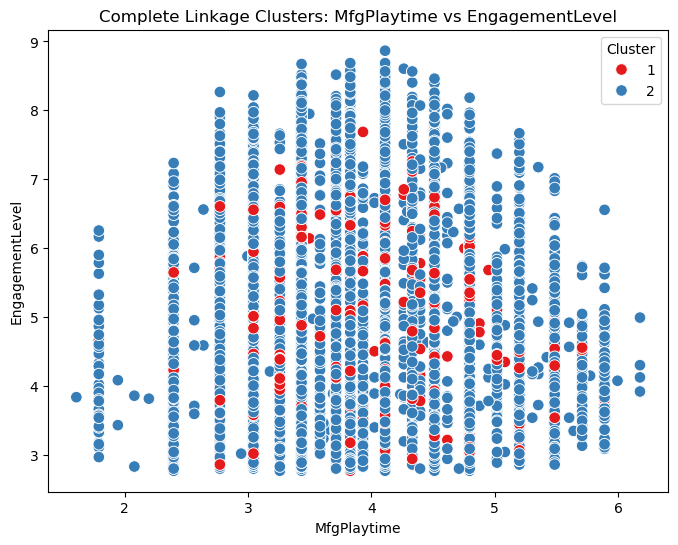

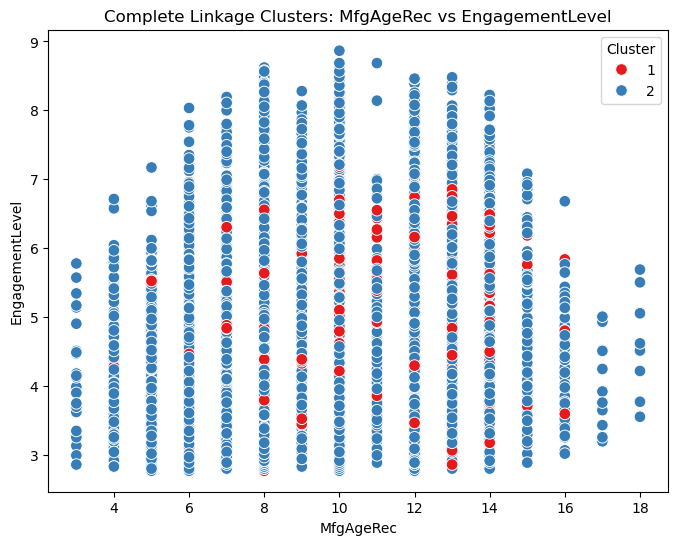

In [48]:
#plotting scatter plots for complete linkage clusters for each pair of features in the filtered dataset
feature_cols = [col for col in df_filtered.columns if col != "Cluster"]
for i in range(len(feature_cols)):
    for j in range(i + 1, len(feature_cols)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(
            data=df_filtered,
            x=feature_cols[i],
            y=feature_cols[j],
            hue=df_filtered["Cluster"],
            palette="Set1",
            s=70
        )
        plt.title(f"Complete Linkage Clusters: {feature_cols[i]} vs {feature_cols[j]}")
        plt.legend(title="Cluster")
        plt.show()

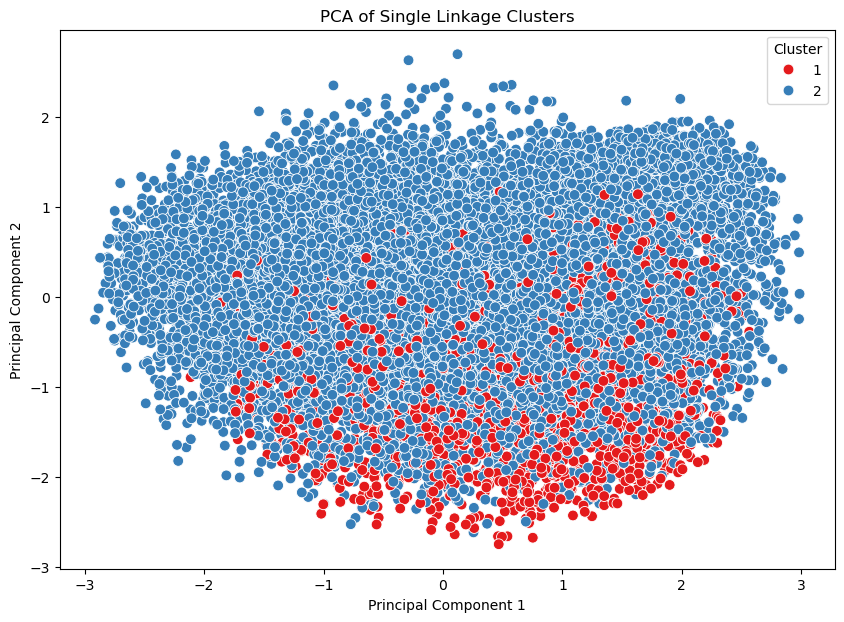

In [49]:
#pca analysis for cluster visualization in 2d
pca_2d_single = PCA(n_components=2)
X_pca_2d_single = pca_2d_single.fit_transform(X_filtered)
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca_2d_single[:, 0],
    y=X_pca_2d_single[:, 1],
    hue=cluster_labels_single,
    palette="Set1",
    s=60
) 
plt.title("PCA of Single Linkage Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.show()

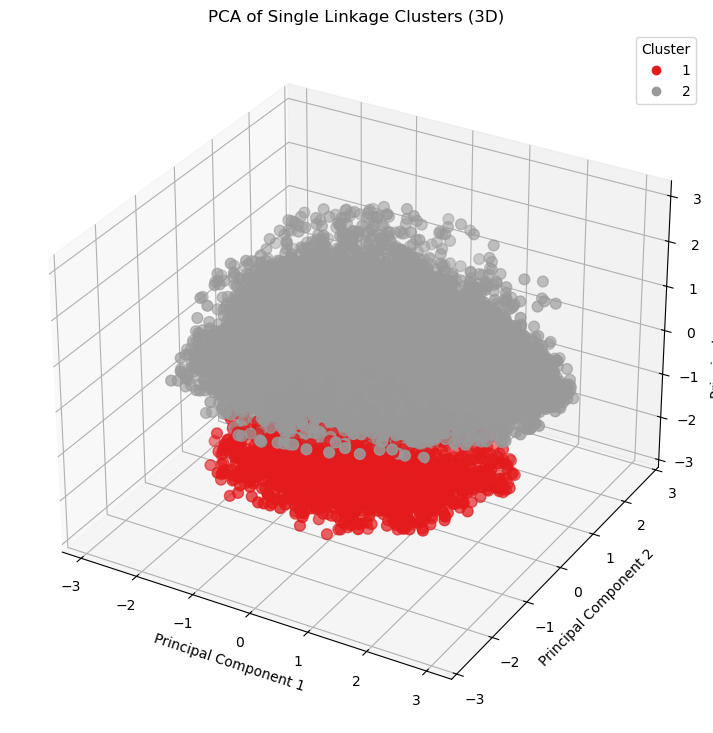

In [50]:
#pca analysis for cluster visualization in 3d
pca_3d_single = PCA(n_components=3)
X_pca_3d_single = pca_3d_single.fit_transform(X_filtered)
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    X_pca_3d_single[:, 0],
    X_pca_3d_single[:, 1],
    X_pca_3d_single[:, 2],
    c=cluster_labels_single,
    cmap="Set1",
    s=60
)
ax.set_title("PCA of Single Linkage Clusters (3D)")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")
plt.legend(*scatter.legend_elements(), title="Cluster")
plt.show()    

## Average Linkage

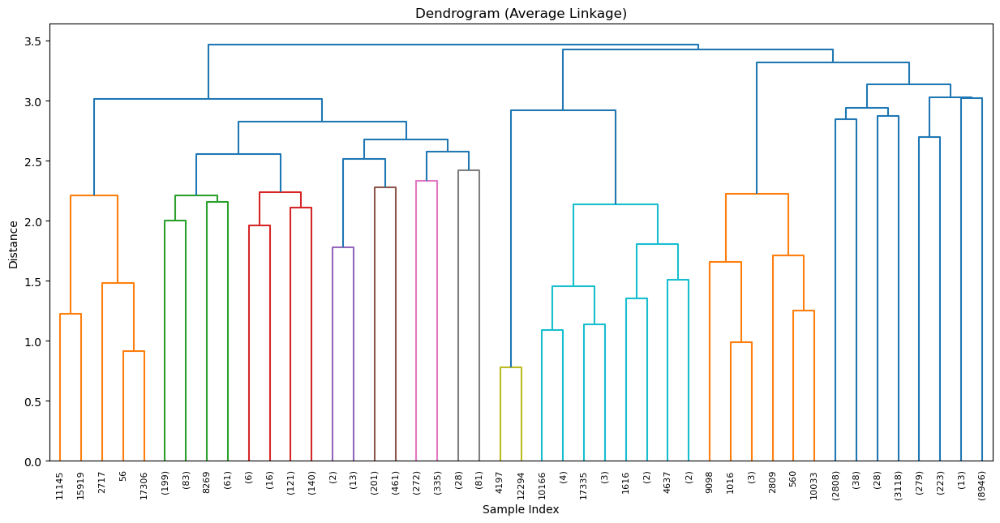

In [51]:
# === Average Linkage clustering ===
Z_average = linkage(X_filtered, method='average')

# === Plot the dendrogram ===
plt.figure(figsize=(15, 7))
dendrogram(
    Z_average,
    truncate_mode='level',
    p=5
)
plt.title("Dendrogram (Average Linkage)")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

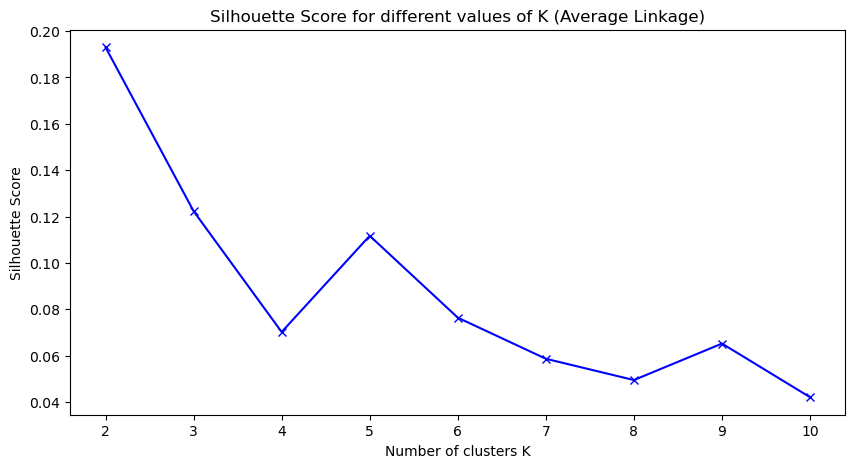

In [52]:
#silhouette analysis for average linkage
silhouette_scores_average = []
K = range(2, 11)
for k in K:
    cluster_labels_average = fcluster(Z_average, k, criterion='maxclust')
    score_average = silhouette_score(X_filtered, cluster_labels_average)
    silhouette_scores_average.append(score_average)
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores_average, 'bx-')
plt.xlabel('Number of clusters K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different values of K (Average Linkage)')
plt.show() 


In [53]:
#assigning clusters for average linkage with k = 3
best_k_average = 2  # assuming 3 is the best k from silhouette analysis
cluster_labels_average = fcluster(Z_average, best_k_average, criterion='maxclust')
df_filtered['Cluster'] = cluster_labels_average
print(df_filtered['Cluster'].value_counts())



Cluster
2    15478
1     2025
Name: count, dtype: int64
